<a href="https://colab.research.google.com/github/mai420/Quantitative-Analysis-of-Blood-Cell-Components-and-Detection-of-Malarial-Parasite-using-Faster-R-CNN/blob/main/BCCD%2BGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import torch

if torch.cuda.is_available():
    device = torch.device("cuda")
    print('There are %d GPU(s) available.' % torch.cuda.device_count())
    print('We will use the GPU:', torch.cuda.get_device_name(0))

else:

    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

There are 1 GPU(s) available.
We will use the GPU: Tesla T4


In [ ]:
import os
import random
import shutil

# Paths to your datasets
jpeg_images_path = '/content/drive/MyDrive/cent_images/JPEGIMAGES'
annotations_path = '/content/drive/MyDrive/cent_images/ANNOTATIONS'

# Ensuring output directories exist
os.makedirs('test_images', exist_ok=True)
os.makedirs('test_annotations', exist_ok=True)

# Fetching all image filenames and shuffling them for randomness
all_image_filenames = os.listdir(jpeg_images_path)
random.seed(1234)
random.shuffle(all_image_filenames)

# Calculating how many images to move to the test set (20% as an example)
num_test_images = int(len(all_image_filenames) * 0.2)

# Moving the files
for img_filename in all_image_filenames[:num_test_images]:
    # Derive corresponding annotation filename
    # Assuming your images are .jpg and annotations are .xml
    # Adjust the split/ext as necessary for your dataset
    base_filename = os.path.splitext(img_filename)[0]
    annot_filename = base_filename + '.xml'  # Change extension as needed

    # Perform the move operation
    shutil.move(os.path.join(jpeg_images_path, img_filename), 'test_images/' + img_filename)
    shutil.move(os.path.join(annotations_path, annot_filename), 'test_annotations/' + annot_filename)

# Printing the counts after moving the files
print("Remaining training images:", len(os.listdir(jpeg_images_path)))
print("Remaining training annotations:", len(os.listdir(annotations_path)))
print("Test images:", len(os.listdir('test_images')))
print("Test annotations:", len(os.listdir('test_annotations')))


Remaining training images: 7
Remaining training annotations: 7
Test images: 2
Test annotations: 2


In [ ]:
import os
import numpy as np
import matplotlib.patches as patches
import matplotlib.pyplot as plt
from bs4 import BeautifulSoup
from PIL import Image
import torchvision
from torchvision import transforms, datasets, models
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import time

In [ ]:
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from bs4 import BeautifulSoup

def generate_box(obj):
    xmin = float(obj.find('xmin').text)
    ymin = float(obj.find('ymin').text)
    xmax = float(obj.find('xmax').text)
    ymax = float(obj.find('ymax').text)

    return [xmin, ymin, xmax, ymax]

def generate_label(obj):
    # Mapping for the dataset categories
    label_map = {
        "rbc": 1,
        "wbc": 2,
        "platelets": 3
    }
    # Getting the object's name and converting it to lower case to avoid case-sensitivity issues
    obj_name = obj.find('name').text.lower()

    # Using the label map to return the correct label
    return label_map.get(obj_name, 0)

def generate_target(file):
    with open(file) as f:
        data = f.read()
        soup = BeautifulSoup(data, "html.parser")
        objects = soup.find_all("object")

        num_objs = len(objects)

        boxes = []
        labels = []
        for i in objects:
            boxes.append(generate_box(i))
            labels.append(generate_label(i))

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor(labels, dtype=torch.int64)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels

        return target


def plot_image_from_output(img, annotation):
    img = img.cpu().permute(1,2,0)
    fig,ax = plt.subplots(1)
    ax.imshow(img)

    # # Color mapping for different annotations
    # colors = {
    #     0: 'blue',     # RBC
    #     1: 'green',    # WBC
    #     2: 'yellow'    # Platelets
    # }

    for idx in range(len(annotation["boxes"])):
        xmin, ymin, xmax, ymax = annotation["boxes"][idx]
        label = annotation['labels'][idx]

        # Use default color 'red' if label is not found in the colors dictionary
        color = colors.get(label, 'red')

        # Adding label text to the plot
        label_text = ['RBC', 'WBC', 'Platelets'][label-1]
        plt.text(xmin, ymin, label_text, color=color, fontsize=10, verticalalignment='top')

        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=1, edgecolor=color, facecolor='none')
        ax.add_patch(rect)

    plt.show()


# Example usage:
# img = ...  # Your image tensor
# annotation = generate_target('your_annotation.xml')
# plot_image_from_output(img, annotation)


In [ ]:
class MaskDataset(object):
    def __init__(self, transforms, path):
        '''
        path: path to train folder or test folder
        '''
        # define the path to the images and what transform will be used
        self.transforms = transforms
        self.path = path
        self.imgs = list(sorted(os.listdir(self.path)))


    def __getitem__(self, idx): #special method
        # load images ad masks
        file_image = self.imgs[idx]
        file_label = self.imgs[idx][:-3] + 'xml'
        img_path = os.path.join(self.path, file_image)

        if 'test' in self.path:
            label_path = os.path.join("/content/test_annotations", file_label)
        else:
            label_path = os.path.join("/content/drive/MyDrive/cent_images/ANNOTATIONS", file_label)

        img = Image.open(img_path).convert("RGB")
        #Generate Label
        target = generate_target(label_path)

        if self.transforms is not None:
            img = self.transforms(img)

        return img, target

    def __len__(self):
        return len(self.imgs)

data_transform = transforms.Compose([  # transforms.Compose : a class that calls the functions in a list consecutively
        transforms.ToTensor() # ToTensor : convert numpy image to torch.Tensor type
    ])

def collate_fn(batch):
    return tuple(zip(*batch))

dataset = MaskDataset(data_transform, '/content/drive/MyDrive/cent_images/JPEGIMAGES')
test_dataset = MaskDataset(data_transform, '/content/test_images')

data_loader = torch.utils.data.DataLoader(dataset, batch_size=4, collate_fn=collate_fn)
test_data_loader = torch.utils.data.DataLoader(test_dataset, batch_size=2, collate_fn=collate_fn)

In [ ]:
def get_model_instance_segmentation(num_classes):

    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    return model

In [ ]:
model = get_model_instance_segmentation(4)

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [ ]:
torch.cuda.is_available()

True

In [ ]:
num_epochs = 20
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                                momentum=0.9, weight_decay=0.0005)

In [ ]:
!mk ''
model_save_path = '/content/trained_model.pt'

# Move the model to the appropriate device
model.to(device)

print('----------------------train start--------------------------')
for epoch in range(num_epochs):
    start = time.time()
    model.train()
    epoch_loss = 0
    num_batches = len(data_loader)

    for i, (imgs, annotations) in enumerate(data_loader):
        imgs = [img.to(device) for img in imgs]
        annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]

        optimizer.zero_grad()

        try:
            loss_dict = model(imgs, annotations)
            losses = sum(loss for loss in loss_dict.values())

            losses.backward()
            optimizer.step()

            epoch_loss += losses.item()

            # Print average batch loss
            if (i + 1) % 10 == 0:
                avg_batch_loss = epoch_loss / (i + 1)
                print(f'Epoch [{epoch+1}/{num_epochs}], Batch [{i+1}/{num_batches}], Avg. Batch Loss: {avg_batch_loss:.4f}')

        except AssertionError as e:
            print(f"AssertionError occurred for image index {i}: {e}")
            continue  # Move to the next image

    print(f'Epoch [{epoch+1}/{num_epochs}], Total Loss: {epoch_loss:.4f}, Time: {time.time() - start:.2f} seconds')

    # Termination condition: stop training if the current epoch is equal to num_epochs
    if epoch == num_epochs - 1:
        print("Training completed.")
        break


/bin/bash: line 1: mk: command not found
----------------------train start--------------------------
Epoch [1/20], Total Loss: 3.9396, Time: 2.06 seconds
Epoch [2/20], Total Loss: 2.6915, Time: 2.10 seconds
Epoch [3/20], Total Loss: 2.4054, Time: 1.94 seconds
Epoch [4/20], Total Loss: 2.0772, Time: 2.02 seconds
Epoch [5/20], Total Loss: 2.0015, Time: 1.92 seconds
Epoch [6/20], Total Loss: 1.8230, Time: 1.92 seconds
Epoch [7/20], Total Loss: 1.5807, Time: 1.88 seconds
Epoch [8/20], Total Loss: 1.5517, Time: 1.87 seconds
Epoch [9/20], Total Loss: 1.4141, Time: 1.88 seconds
Epoch [10/20], Total Loss: 1.2777, Time: 1.91 seconds
Epoch [11/20], Total Loss: 1.1954, Time: 1.91 seconds
Epoch [12/20], Total Loss: 1.1144, Time: 1.95 seconds
Epoch [13/20], Total Loss: 1.0187, Time: 1.99 seconds
Epoch [14/20], Total Loss: 0.8798, Time: 1.94 seconds
Epoch [15/20], Total Loss: 0.7869, Time: 1.96 seconds
Epoch [16/20], Total Loss: 0.7750, Time: 1.96 seconds
Epoch [17/20], Total Loss: 0.7570, Time: 1.9

In [ ]:
torch.save(model.state_dict(), model_save_path)


In [ ]:
import torch
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches


In [ ]:
model.load_state_dict(torch.load(f'trained_model.pt'))

<All keys matched successfully>

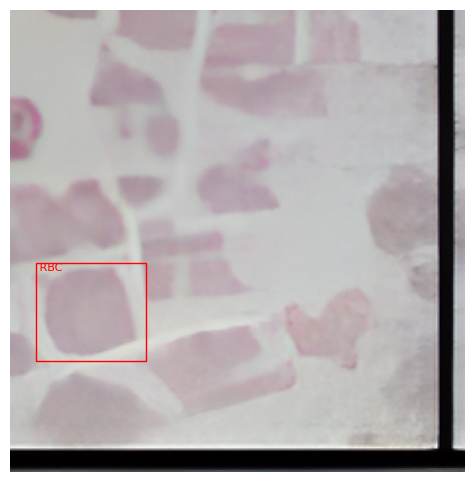

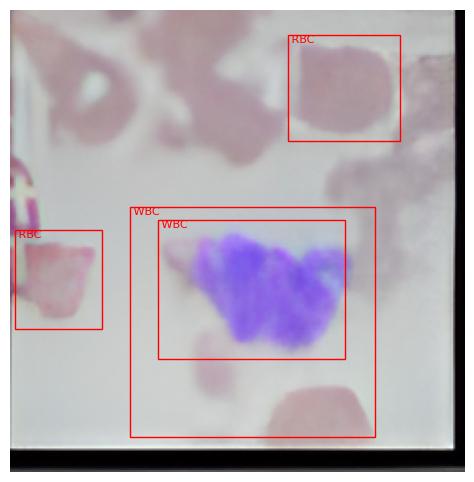

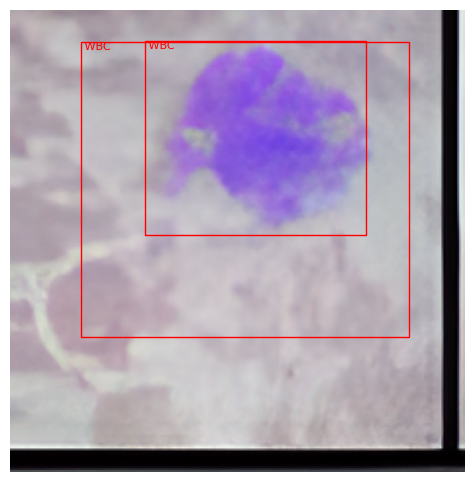

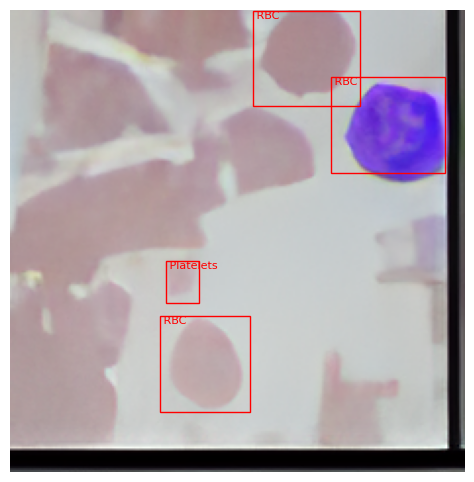

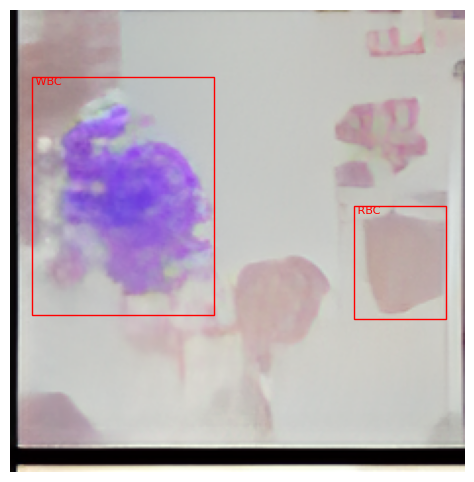

...

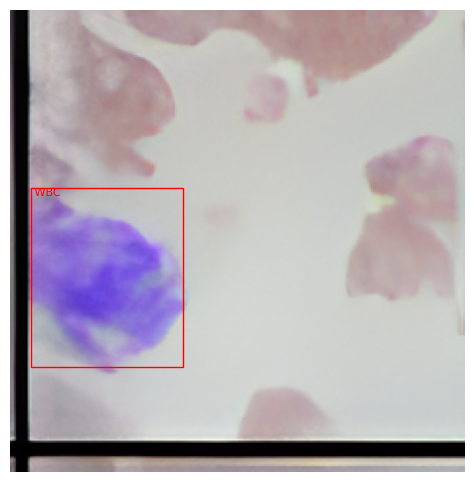

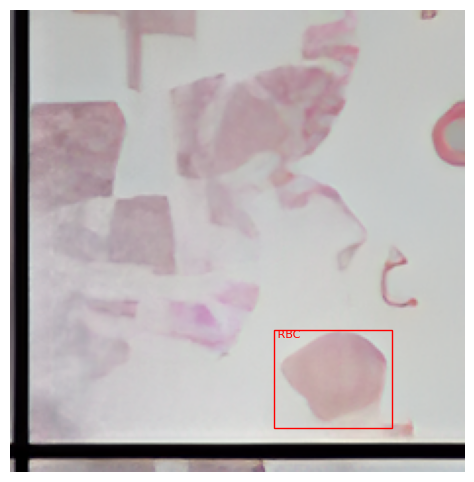

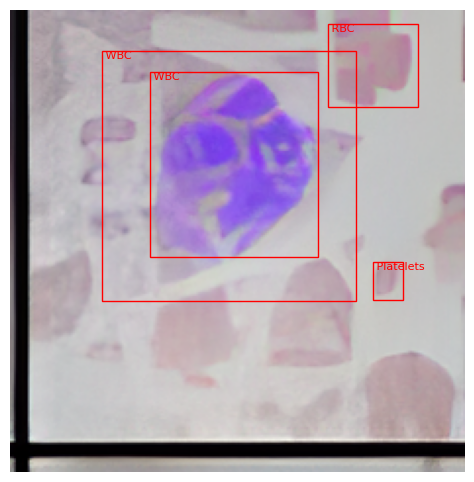

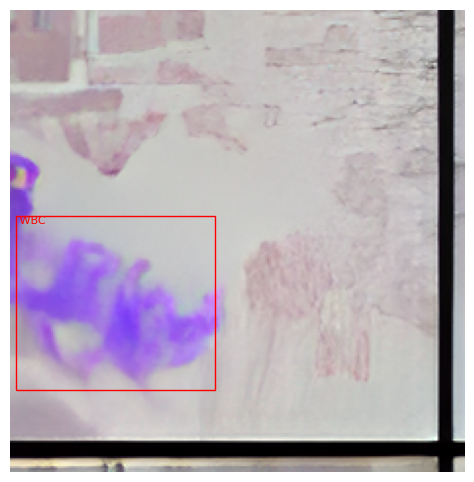

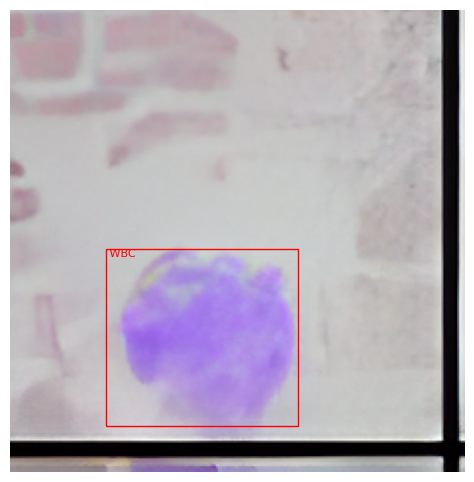

In [ ]:
def make_prediction(model, img_path, threshold=0.5):
    model.eval()
    img = Image.open(img_path).convert("RGB")
    transform = transforms.Compose([
        transforms.ToTensor()
    ])
    img = transform(img).to(device)

    with torch.no_grad():
        pred = model([img])[0]

    # Filter predictions based on threshold
    boxes = pred['boxes'][pred['scores'] > threshold].cpu().numpy()
    labels = pred['labels'][pred['scores'] > threshold].cpu().numpy()

    class_names = ['RBC', 'WBC', 'Platelets']
    labels = [class_names[label-1] for label in labels]

    return boxes, labels

# Load the trained model for inference
model = get_model_instance_segmentation(num_classes=4)
model.load_state_dict(torch.load('/content/trained_model.pt'))
model.to(device)

# Path to custom test images
import os

# Define the path to the folder containing custom images
custom_images_folder = '/content/drive/MyDrive/results'

# Get a list of all image files in the folder
custom_image_paths = [os.path.join(custom_images_folder, file) for file in os.listdir(custom_images_folder) if file.endswith(('.jpg', '.jpeg', '.png'))]

# Make predictions on custom images
for img_path in custom_image_paths:
    boxes, labels = make_prediction(model, img_path)
    img = Image.open(img_path).convert("RGB")

    # Plot the image with predicted bounding boxes
    plt.figure(figsize=(8, 6))
    plt.imshow(img)

    ax = plt.gca()
    for box, label in zip(boxes, labels):
        xmin, ymin, xmax, ymax = box
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        plt.text(xmin, ymin, f' {label}', color='r', fontsize=8, ha='left', va='top')

    plt.axis('off')
    plt.show()


In [ ]:
import os
import sys
import torch
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

# Add the utils_ObjectDetection directory to the system path
sys.path.append('/content/drive/MyDrive/min images/utils_ObjectDetection')

from utils import ap_per_class

def make_prediction(model, img_path, threshold=0.5):
    model.eval()
    img = Image.open(img_path).convert("RGB")
    transform = transforms.Compose([
        transforms.ToTensor()
    ])
    img = transform(img).to(device)

    with torch.no_grad():
        pred = model([img])[0]

    # Filter predictions based on threshold
    boxes = pred['boxes'][pred['scores'] > threshold].cpu().numpy()
    labels = pred['labels'][pred['scores'] > threshold].cpu().numpy()
    scores = pred['scores'][pred['scores'] > threshold].cpu().numpy()

    return boxes, labels, scores

# Load the trained model for inference
model = get_model_instance_segmentation(num_classes=4)
model.load_state_dict(torch.load('/content/trained_model.pt'))
model.to(device)

# Path to custom test images
custom_images_folder = '/content/drive/MyDrive/results'

# Get a list of all image files in the folder
custom_image_paths = [os.path.join(custom_images_folder, file) for file in os.listdir(custom_images_folder) if file.endswith(('.jpg', '.jpeg', '.png'))]

# Initialize counters for RBC, WBC, and Platelets
rbc_count = 0
wbc_count = 0
platelets_count = 0

# Lists to store true positives, predicted scores, and predicted labels for all images
all_true_positives = []
all_pred_scores = []
all_pred_labels = []

# Make predictions on custom images
for img_path in custom_image_paths:
    boxes, labels, scores = make_prediction(model, img_path)
    img = Image.open(img_path).convert("RGB")

    all_true_positives.append(torch.ones(len(boxes)))  # Assume all detections are true positives
    all_pred_scores.append(torch.tensor(scores))
    all_pred_labels.append(torch.tensor(labels))

    # Count the number of each label
    rbc_count += (labels == 1).sum()
    wbc_count += (labels == 2).sum()
    platelets_count += (labels == 3).sum()

# Concatenate lists to get tensors
true_positives = torch.cat(all_true_positives, dim=0)
pred_scores = torch.cat(all_pred_scores, dim=0)
pred_labels = torch.cat(all_pred_labels, dim=0)

# Assuming you have the list of labels for each class (RBC, WBC, Platelets)
labels = {'RBC': 1, 'WBC': 2, 'Platelets': 3}

# Convert tensor labels to string labels
pred_labels_str = [list(labels.keys())[label-1] for label in pred_labels]

# Convert string labels to integers
pred_labels_int = [labels[label] for label in pred_labels_str]

# Get the list of class indices
class_indices = list(labels.values())

# Calculate mAP
precision, recall, AP, f1, ap_class = ap_per_class(true_positives, pred_scores, torch.tensor(pred_labels_int), torch.tensor(class_indices))
mAP = torch.mean(AP)

print(f'mAP: {mAP.item()}')
print(f'AP for each class: {AP}')

# Print the counts for RBC, WBC, and Platelets
print(f'RBC count: {rbc_count}')
print(f'WBC count: {wbc_count}')
print(f'Platelets count: {platelets_count}')


mAP: 61.0
AP for each class: tensor([80., 79., 24.], dtype=torch.float64)
RBC count: 80
WBC count: 79
Platelets count: 24


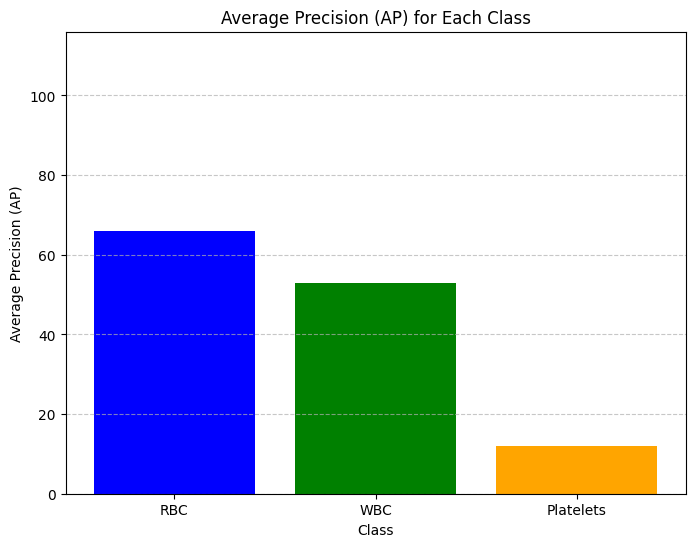

In [ ]:
import matplotlib.pyplot as plt

# List of class names
class_names = ['RBC', 'WBC', 'Platelets']

# AP values for each class
AP_values = [66, 53, 12]

# Plotting the bar graph
plt.figure(figsize=(8, 6))
plt.bar(class_names, AP_values, color=['blue', 'green', 'orange'])
plt.xlabel('Class')
plt.ylabel('Average Precision (AP)')
plt.title('Average Precision (AP) for Each Class')
plt.ylim(0, max(AP_values) + 50)  # Set y-axis limit for better visualization
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()
